# Análise de casos de suicídios de 1985 a 2015
## Um comparação com dados socioeconômicos

<a href="https://www.kaggle.com/scsaurabh/suicide-rates-stats-economics-demographics">Referências</a>
</br>
<a href="https://www.kaggle.com/val0904/suicides-rates-overview">Artigo</a>

In [1]:
pip install sqlalchemy psycopg2

Note: you may need to restart the kernel to use updated packages.


In [46]:
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from scipy.stats import pearsonr
import plotly.express as px
#import warnings
#warnings.filterwarnings('ignore')

## I - Carregamento de Dados

### 1.1.1 - Load PostgresSQL

In [15]:
from sqlalchemy import create_engine
# Postgres username, password, and database name
POSTGRES_ADDRESS = 'localhost' ## INSERT YOUR DB ADDRESS IF IT'S NOT ON PANOPLY
POSTGRES_PORT = '5433'
POSTGRES_USERNAME = 'postgres' ## CHANGE THIS TO YOUR PANOPLY/POSTGRES USERNAME
POSTGRES_PASSWORD = '1926' ## CHANGE THIS TO YOUR PANOPLY/POSTGRES PASSWORD POSTGRES_DBNAME = 'database' ## CHANGE THIS TO YOUR DATABASE NAME
POSTGRES_DBNAME = 'db_suicidio'
# A long string that contains the necessary Postgres login information
postgres_str = ('postgresql://{username}:{password}@{ipaddress}:{port}/{dbname}'.format(username=POSTGRES_USERNAME,password=POSTGRES_PASSWORD,ipaddress=POSTGRES_ADDRESS,port=POSTGRES_PORT,dbname=POSTGRES_DBNAME))
# Create the connection
cnx = create_engine(postgres_str)

In [19]:
suicidios = pd.read_sql_query('''SELECT * FROM suicidio;''', cnx)

### 1.1.2 - Load Dataset CSV

In [28]:
suicidios = pd.read_csv('data/suicides_1985_2016.csv')

### 1.2 - Informações dos Dados

###### Colunas:

<ul>
  <li><strong>country:</strong>           país;</li>
  <li><strong>year:</strong>              ano;</li>
  <li><strong>sex:</strong>               sexo;</li>
  <li><strong>age:</strong>               faixa etária;</li>
  <li><strong>suicides_no:</strong>       contagem de suicídios;</li>
  <li><strong>population:</strong>       população;</li>
  <li><strong>suicides_100k_pop:</strong> taxa de suicídio;</li>
  <li><strong>gdp_per_capita:</strong>    PIB per capita;</li>
  <li><strong>generation:</strong>        geração (com base na média de grupos de idade).</li>
</ul>

In [3]:
suicidios.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27820 entries, 0 to 27819
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   country            27820 non-null  object 
 1   year               27820 non-null  int64  
 2   sex                27820 non-null  object 
 3   age                27820 non-null  object 
 4   suicides_no        27820 non-null  int64  
 5   population         27820 non-null  int64  
 6   suicides_100k_pop  27820 non-null  float64
 7   gdp_per_capita     27820 non-null  int64  
 8   generation         27820 non-null  object 
dtypes: float64(1), int64(4), object(4)
memory usage: 1.9+ MB


## II - Explicação dos Dados

In [4]:
suicidios

,country,year,sex,age,suicides_no,population,suicides_100k_pop,gdp_per_capita,generation
0,Albania,1987,male,15-24 years,21,312900,6.71,796,Generation X
1,Albania,1987,male,35-54 years,16,308000,5.19,796,Silent
2,Albania,1987,female,15-24 years,14,289700,4.83,796,Generation X
3,Albania,1987,male,75+ years,1,21800,4.59,796,G.I. Generation
4,Albania,1987,male,25-34 years,9,274300,3.28,796,Boomers
...,...,...,...,...,...,...,...,...,...
27815,Uzbekistan,2014,female,35-54 years,107,3620833,2.96,2309,Generation X
27816,Uzbekistan,2014,female,75+ years,9,348465,2.58,2309,Silent
27817,Uzbekistan,2014,male,5-14 years,60,2762158,2.17,2309,Generation Z
27818,Uzbekistan,2014,female,5-14 years,44,2631600,1.67,2309,Generation Z


### Tabelas Fato e Dimensão

### Tabelas DIMENSAO
table COUNTRY

table SEX

table AGE

table GENERATION

table YEAR

table RATING

table GDB_PER_CAPITA


In [5]:
suicidios.describe()

,year,suicides_no,population,suicides_100k_pop,gdp_per_capita
count,27820.000000,27820.000000,2.782000e+04,27820.000000,27820.000000
mean,2001.258375,242.574407,1.844794e+06,12.816097,16866.464414
std,8.469055,902.047917,3.911779e+06,18.961511,18887.576472
min,1985.000000,0.000000,2.780000e+02,0.000000,251.000000
25%,1995.000000,3.000000,9.749850e+04,0.920000,3447.000000
50%,2002.000000,25.000000,4.301500e+05,5.990000,9372.000000
75%,2008.000000,131.000000,1.486143e+06,16.620000,24874.000000
max,2016.000000,22338.000000,4.380521e+07,224.970000,126352.000000


In [6]:
casos_por_ano = suicidios.groupby('year').agg(sum_cases=('suicides_no', 'sum'), qtde=('suicides_no', 'count')).reset_index()
casos_por_ano.sort_values(['sum_cases','qtde'], ascending=False)

,year,sum_cases,qtde
14,1999,256119,996
17,2002,256095,1032
18,2003,256079,1032
15,2000,255832,1032
16,2001,250652,1056
13,1998,249591,948
11,1996,246725,924
10,1995,243544,936
24,2009,243487,1068
19,2004,240861,1008


In [7]:
casos_por_geracao = suicidios.groupby('generation').agg(sum_cases=('suicides_no', 'sum'), qtde=('suicides_no', 'count')).reset_index()
casos_por_geracao.sort_values(['sum_cases','qtde'], ascending=False)

,generation,sum_cases,qtde
0,Boomers,2284498,4990
5,Silent,1781744,6364
2,Generation X,1532804,6408
4,Millenials,623459,5844
1,G.I. Generation,510009,2744
3,Generation Z,15906,1470


###### Gerações das vítimas de suicídio:

<ul>
  <li><strong>G.I. Generation (geração grandiosa):</strong> nascidos entre 1901 a 1927;</li>
  <li><strong>Silent (silenciosa):</strong> nascidos entre 1928 a 1945;</li>
  <li><strong>Boomers:</strong> nascidos entre 1945 a 1964;</li>
  <li><strong>Generation X (geração X):</strong> nascidos entre 1965 a 1979;</li>
  <li><strong>Millenials (geração Y):</strong>   nascidos entre 1980 a 1994;</li>
  <li><strong>Generation Z (geração Z):</strong> nascidos entre 1995 a atual;</li>
</ul>

In [8]:
casos_por_faixa_etaria = suicidios.groupby('age').agg(sum_cases=('suicides_no', 'sum'), qtde=('suicides_no', 'count')).reset_index()
casos_por_faixa_etaria.sort_values(['sum_cases','qtde'], ascending=False)

,age,sum_cases,qtde
2,35-54 years,2452141,4642
4,55-74 years,1658443,4642
1,25-34 years,1123912,4642
0,15-24 years,808542,4642
5,75+ years,653118,4642
3,5-14 years,52264,4610


In [10]:
casos_por_faixa_etaria_genero = suicidios.groupby(['age','sex']).agg(sum_cases=('suicides_no', 'sum'), qtde=('suicides_no', 'count')).reset_index()
casos_por_faixa_etaria_genero.sort_values(['sum_cases','qtde'], ascending=False)

,age,sex,sum_cases,qtde
5,35-54 years,male,1945908,2321
9,55-74 years,male,1228407,2321
3,25-34 years,male,915089,2321
1,15-24 years,male,633105,2321
4,35-54 years,female,506233,2321
11,75+ years,male,431134,2321
8,55-74 years,female,430036,2321
10,75+ years,female,221984,2321
2,25-34 years,female,208823,2321
0,15-24 years,female,175437,2321


In [11]:
paises_por_casos = suicidios.groupby('country').agg(sum_cases=('suicides_no', 'sum'), qtde=('suicides_no', 'count')).reset_index()
paises_por_casos.sort_values(['sum_cases','qtde'], ascending=False)

,country,sum_cases,qtde
75,Russian Federation,1209742,324
98,United States,1034013,372
46,Japan,806902,372
33,France,329127,360
95,Ukraine,319950,336
...,...,...,...
55,Maldives,20,120
1,Antigua and Barbuda,11,324
79,San Marino,4,36
76,Saint Kitts and Nevis,0,36


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


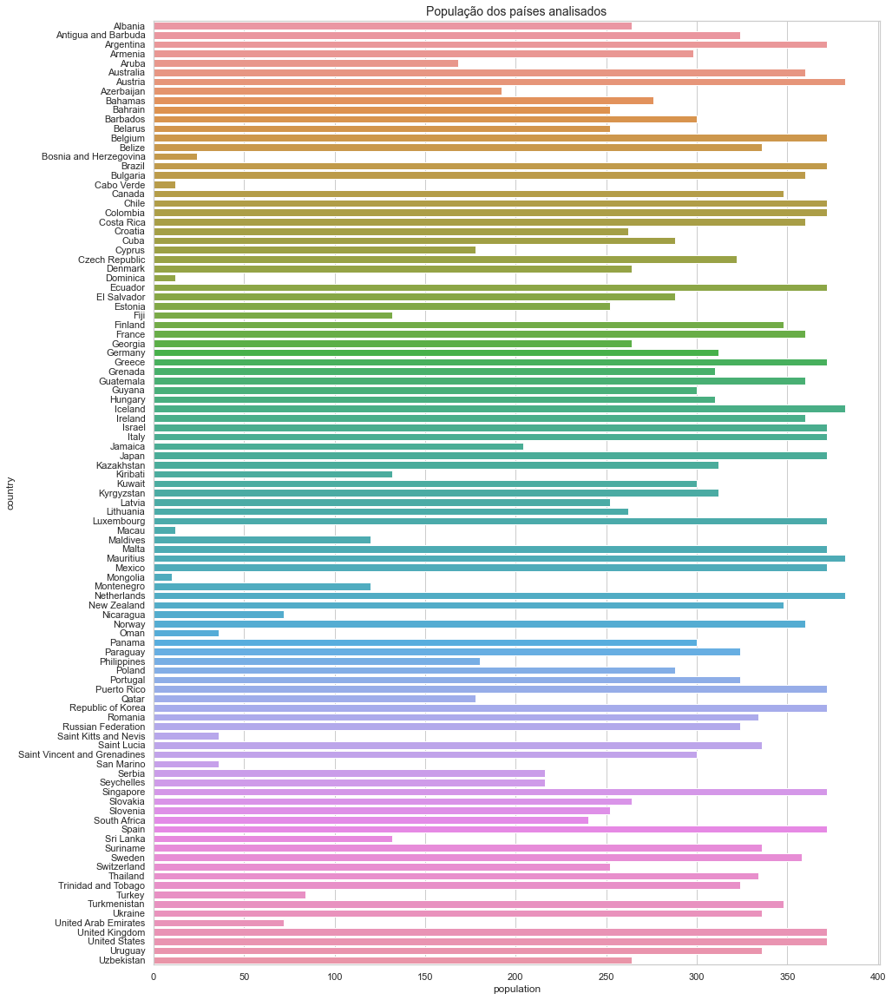

In [12]:
sns.set(style="whitegrid")
f, ax = plt.subplots(figsize=(15, 20))
ax = sns.barplot(suicidios.population.groupby(suicidios.country).count(),suicidios.population.groupby(suicidios.country).count().index)
plt.title('População dos países analisados',fontsize=14)
plt.show(); 

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


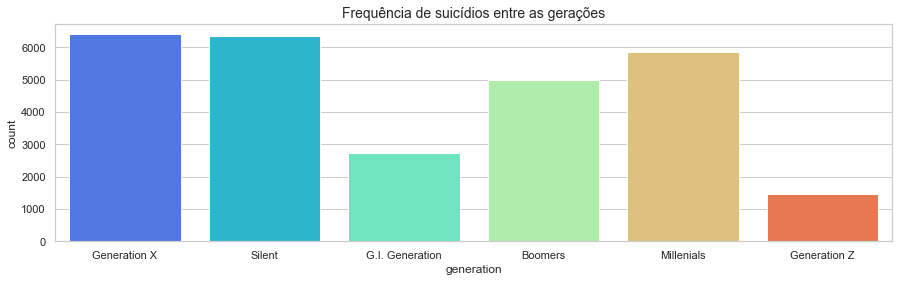

In [13]:
# Frequency of different generations

f,ax = plt.subplots(1,1,figsize=(15,4))
ax = sns.countplot(suicidios.generation,palette='rainbow')
plt.title('Frequência de suicídios entre as gerações',fontsize=14)
plt.show();

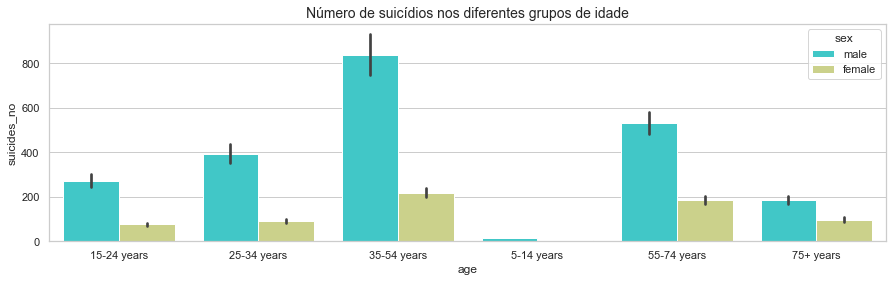

In [14]:
f,ax = plt.subplots(1,1,figsize=(15,4))
ax = sns.barplot(x = suicidios.age.sort_values(),y = 'suicides_no',hue='sex',data=suicidios,palette='rainbow')
plt.title('Número de suicídios nos diferentes grupos de idade',fontsize=14)
plt.show()

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


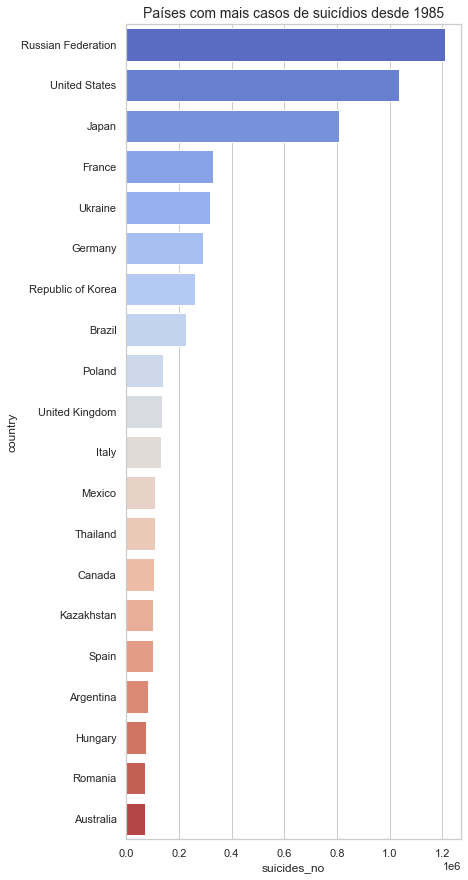

In [15]:
data_suicide = suicidios['suicides_no'].groupby(suicidios.country).sum().sort_values(ascending=False)
f,ax = plt.subplots(1,1,figsize=(6,15))
plt.title('Países com mais casos de suicídios desde 1985',fontsize=14)
ax = sns.barplot(data_suicide.head(20),data_suicide.head(20).index,palette='coolwarm')

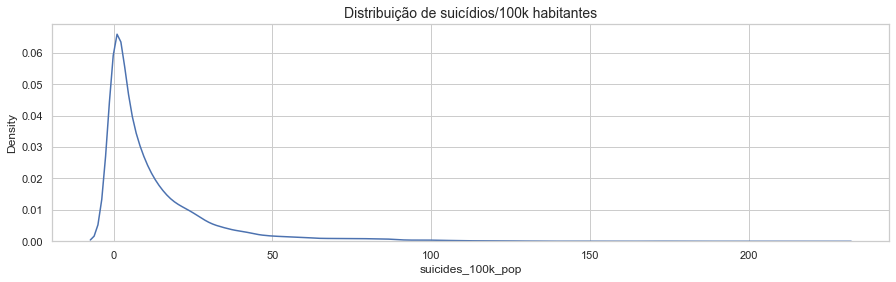

In [16]:
f,ax = plt.subplots(1,1,figsize=(15,4))
ax = sns.kdeplot(suicidios['suicides_100k_pop'])
plt.title('Distribuição de suicídios/100k habitantes',fontsize=14)
plt.show()

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


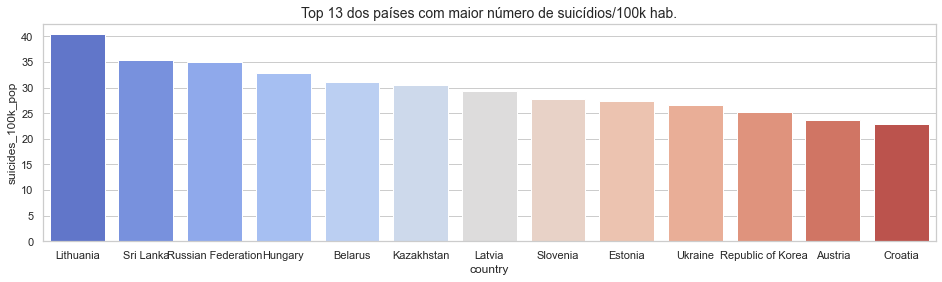

In [17]:
# Top 10 Countries with maximum number of suicides/100k pop

data_suicide_mean = suicidios['suicides_100k_pop'].groupby(suicidios.country).mean().sort_values(ascending=False)
f,ax = plt.subplots(1,1,figsize=(16,4))
plt.title('Top 13 dos países com maior número de suicídios/100k hab.',fontsize=14)
ax = sns.barplot(data_suicide_mean.head(13).index,data_suicide_mean.head(13),palette='coolwarm')

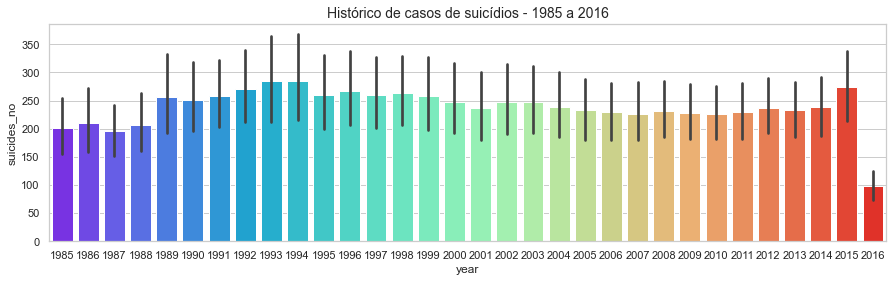

In [18]:
f,ax = plt.subplots(1,1,figsize=(15,4))
#ax = sns.barplot(x = suicidios[suicidios.year > 2000]['year'],y = 'suicides_no',data=suicidios,palette='rainbow')
ax = sns.barplot(x = suicidios['year'],y = 'suicides_no',data=suicidios,palette='rainbow')
plt.title('Histórico de casos de suicídios - 1985 a 2016',fontsize=14)
plt.show()

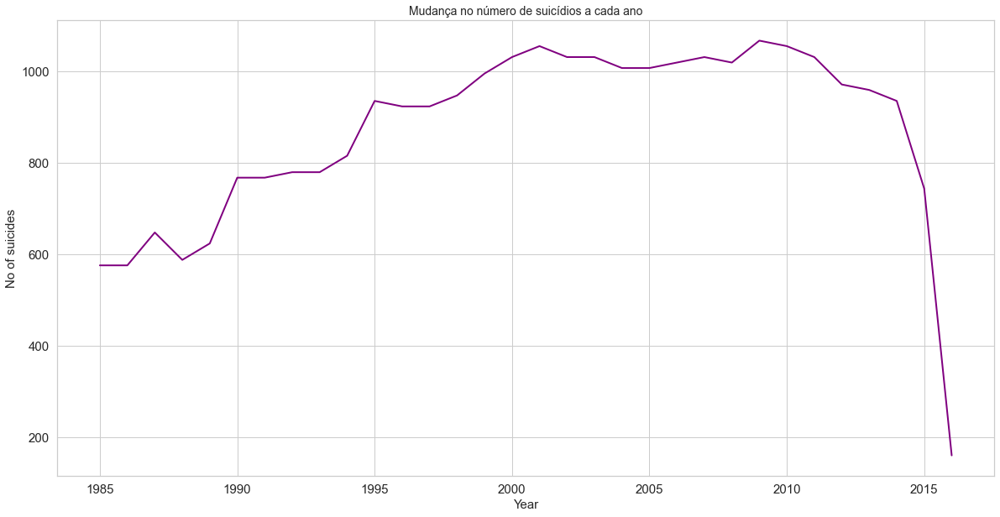

In [19]:
data_time = suicidios['suicides_no'].groupby(suicidios.year).count()
plt.title('Mudança no número de suicídios a cada ano',fontsize=14)
data_time.plot(figsize=(20,10), linewidth=2, fontsize=15,color='purple')
plt.xlabel('Year', fontsize=15)
plt.ylabel('No of suicides',fontsize=15)
plt.show();

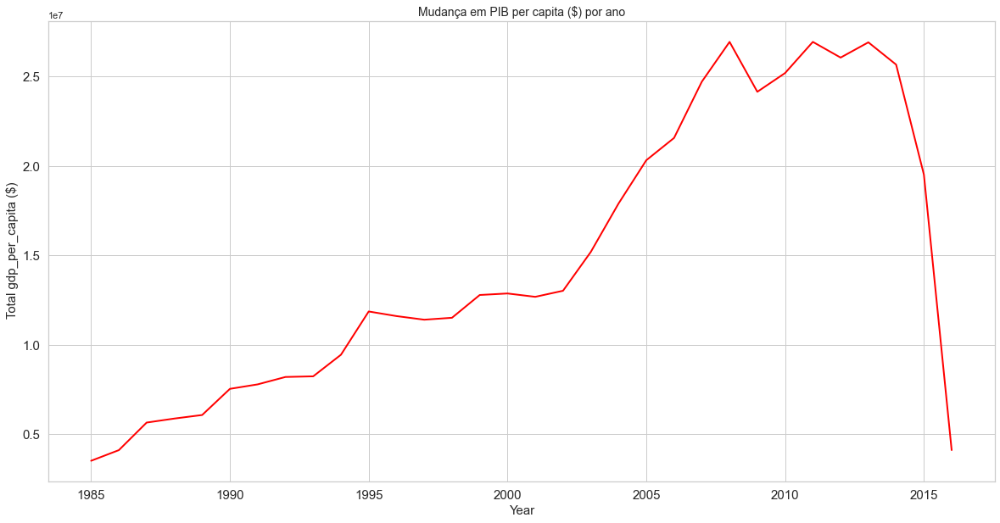

In [20]:
data_gdp = (suicidios['gdp_per_capita'].groupby(suicidios.year)).sum()
plt.title('Mudança em PIB per capita ($) por ano',fontsize=14)
data_gdp.plot(figsize=(20,10), linewidth=2, fontsize=15,color='red')
plt.xlabel('Year', fontsize=15)
plt.ylabel(' Total gdp_per_capita ($)',fontsize=15)
plt.show()

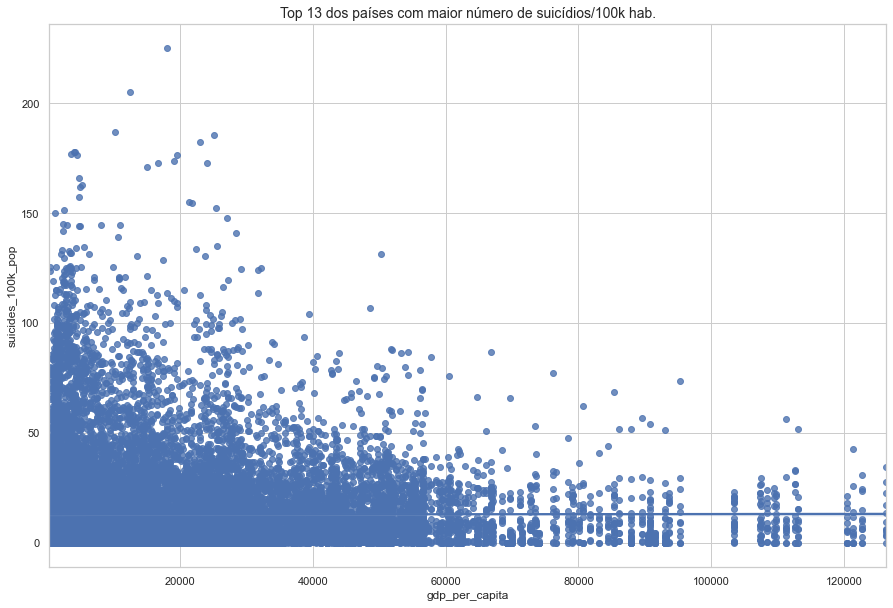

In [21]:
f, ax = plt.subplots(figsize=(15, 10))
ax = sns.regplot(x='gdp_per_capita', y='suicides_100k_pop',data=suicidios)
plt.title('Top 13 dos países com maior número de suicídios/100k hab.',fontsize=14)
plt.show();

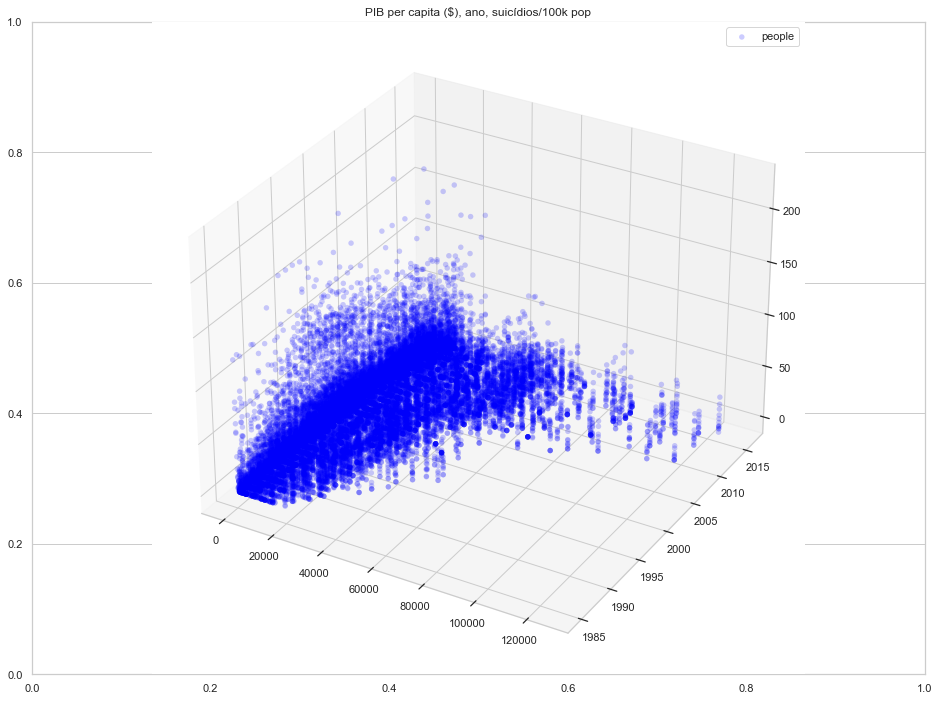

In [22]:
from mpl_toolkits.mplot3d import axes3d
f, ax = plt.subplots(figsize=(16, 12))
ax = f.add_subplot(111, projection='3d')
ax.scatter(suicidios['gdp_per_capita'], suicidios.year, suicidios['suicides_100k_pop'], alpha=0.2, c="blue", edgecolors='none', s=30, label="people") 
plt.title('PIB per capita ($), ano, suicídios/100k pop')
plt.legend(loc=1)
plt.show()

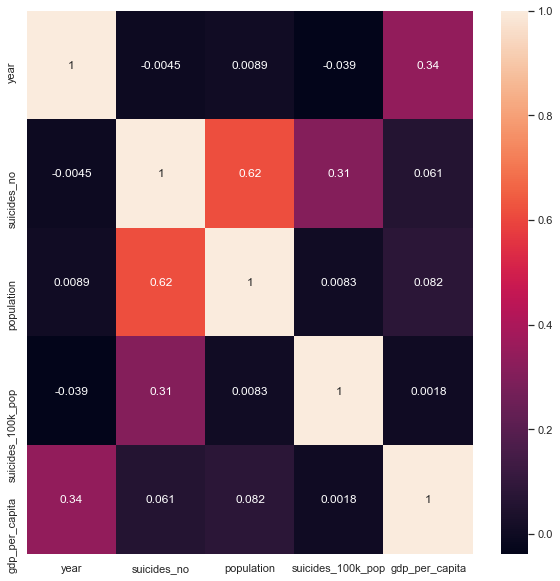

In [23]:
f,ax = plt.subplots(1,1,figsize=(10,10))
ax = sns.heatmap(suicidios.corr(),annot=True)
plt.show()

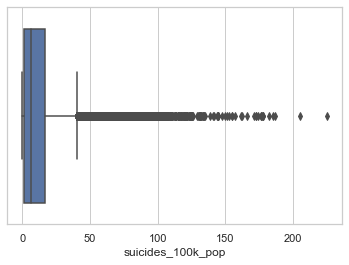

In [24]:
ax = sns.boxplot(x=suicidios['suicides_100k_pop'])

In [30]:
# ADIÇÃO DE COLUNA DE AVALIAÇÃO DA TAXA DE SUICIDIO POR 100K/HAB
conditions = [
    (suicidios["suicides_100k_pop"] >= 0.0003),
    (suicidios["suicides_100k_pop"] < 0.0003) & (suicidios["suicides_100k_pop"] >= 0.00015),
    (suicidios["suicides_100k_pop"] < 0.00015) & (suicidios["suicides_100k_pop"] >= 0.000075),
    (suicidios["suicides_100k_pop"] < 0.000075) & (suicidios["suicides_100k_pop"] >= 0.000)]
values = ["Very high", "Hign", "Moderate", "Low"]
suicidios["rating"] = np.select(conditions, values)
suicidios.head(20)

,country,year,sex,age,suicides_no,population,suicides_100k_pop,gdp_per_capita,generation,rating
0,Albania,1987,male,15-24 years,21,312900,6.71,796,Generation X,Very high
1,Albania,1987,male,35-54 years,16,308000,5.19,796,Silent,Very high
2,Albania,1987,female,15-24 years,14,289700,4.83,796,Generation X,Very high
3,Albania,1987,male,75+ years,1,21800,4.59,796,G.I. Generation,Very high
4,Albania,1987,male,25-34 years,9,274300,3.28,796,Boomers,Very high
5,Albania,1987,female,75+ years,1,35600,2.81,796,G.I. Generation,Very high
6,Albania,1987,female,35-54 years,6,278800,2.15,796,Silent,Very high
7,Albania,1987,female,25-34 years,4,257200,1.56,796,Boomers,Very high
8,Albania,1987,male,55-74 years,1,137500,0.73,796,G.I. Generation,Very high
9,Albania,1987,female,5-14 years,0,311000,0.00,796,Generation X,Low


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


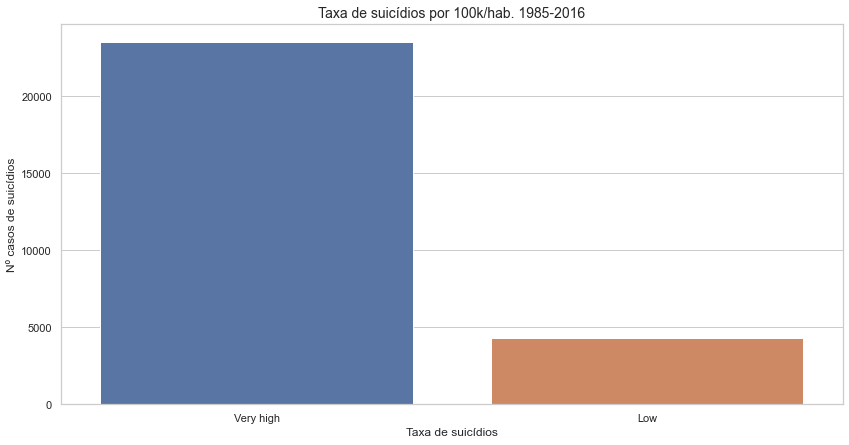

In [35]:
plt.figure(figsize=(14,7))
bar_suicidios_rating = sns.countplot(suicidios['rating'])
plt.title('Taxa de suicídios por 100k/hab. 1985-2016', fontsize=14)
bar_suicidios_rating.set(xlabel='Taxa de suicídios', ylabel='Nº casos de suicídios');
plt.show();

[(0.0, 80000.0)]

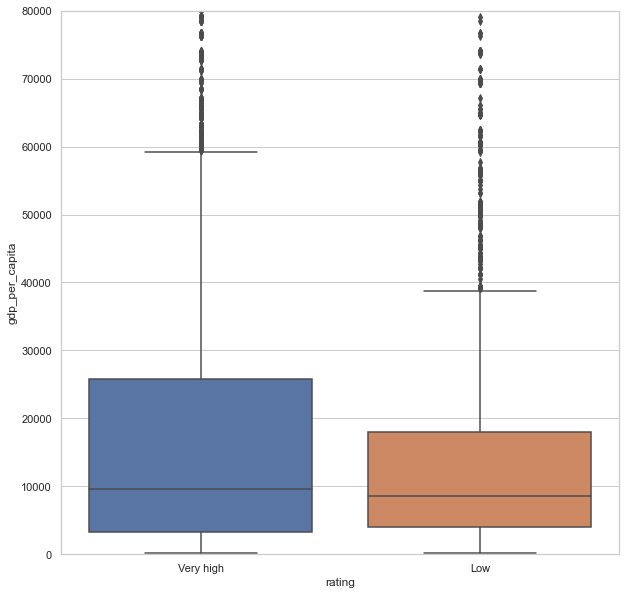

In [31]:
plt.figure(figsize=(10,10))
ax = sns.boxplot(x="rating", y="gdp_per_capita", data=suicidios)
ax.set(ylim=(0, 80000))

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


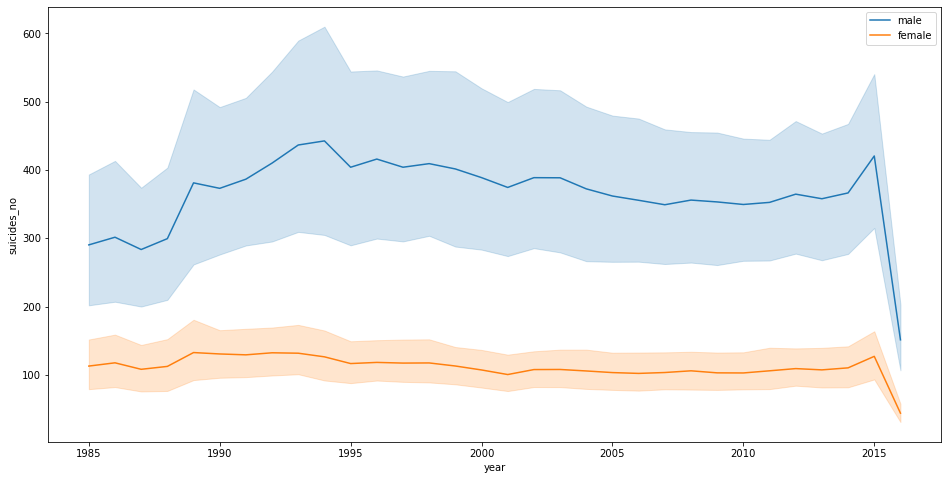

In [12]:
plt.figure(figsize=(16,8))
men = suicidios[suicidios.sex == "male"]
women = suicidios[suicidios.sex == "female"]
sns.lineplot(men.year, suicidios.suicides_no)
sns.lineplot(women.year, suicidios.suicides_no)
plt.legend(["male", 'female'])
plt.show()

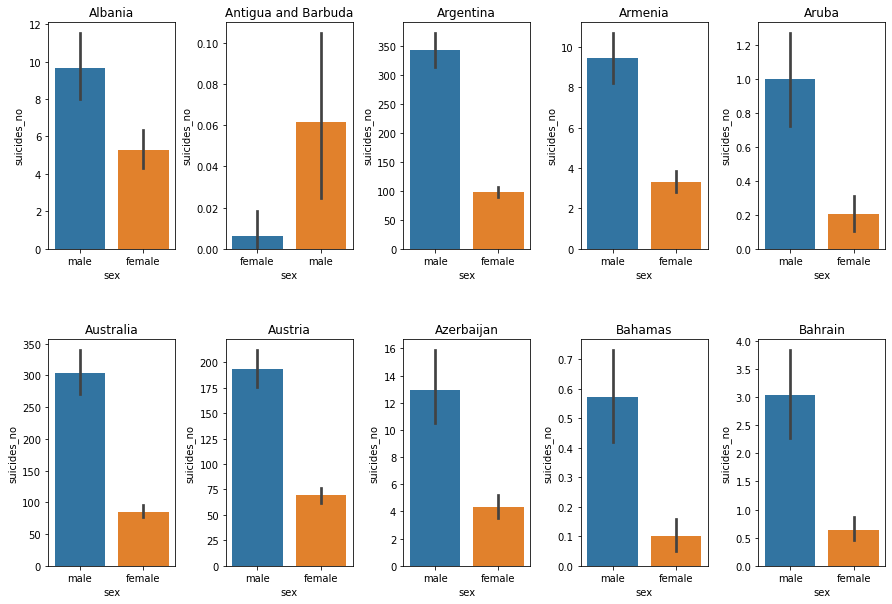

In [25]:
countries = np.array(paises_por_casos["country"].head(15))
fig = plt.figure(figsize=(15,10))
fig.subplots_adjust(hspace=0.4, wspace=0.4)
for i in range(0, 10):
    ax = fig.add_subplot(2, 5, i+1)
    sns.barplot(x="sex", y="suicides_no", data=suicidios[suicidios.country == countries[i]])
    plt.title(countries[i])

Pearsons correlation: 0.061


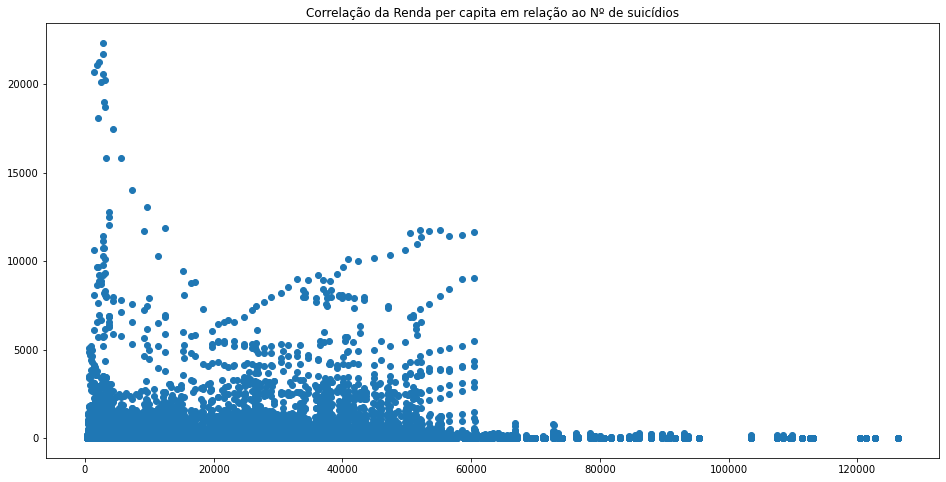

In [35]:
fig = plt.figure(figsize=(16,8))
plt.scatter(suicidios.gdp_per_capita, suicidios.suicides_no)
plt.title("Correlação da Renda per capita em relação ao Nº de suicídios")
corr, _ = pearsonr(suicidios.gdp_per_capita, suicidios.suicides_no)
print('Pearsons correlation: %.3f' % corr)
plt.show()

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


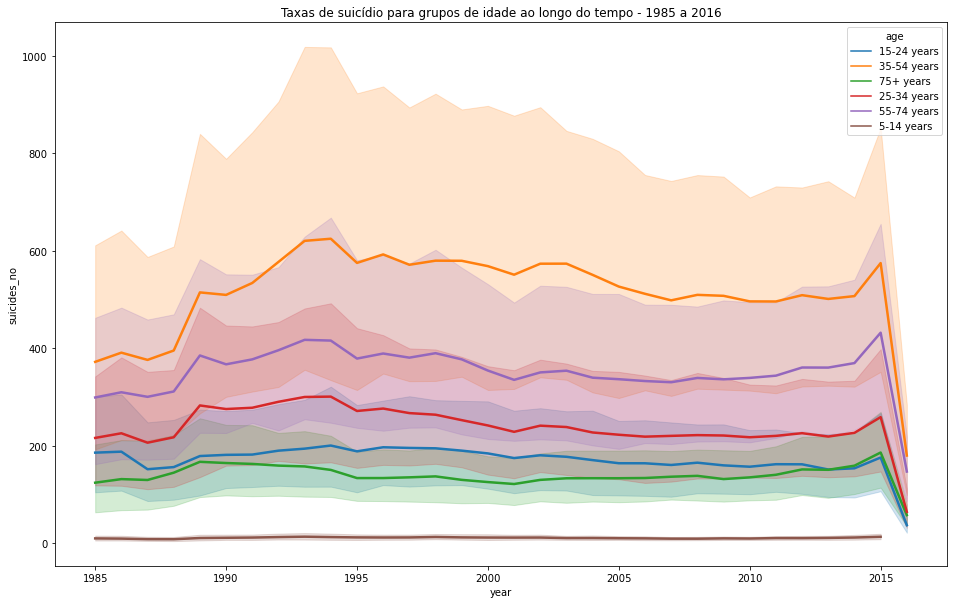

In [19]:
plt.figure(figsize=(16,10))
sns.lineplot("year", suicidios.suicides_no, hue = "age",
             data = suicidios, linewidth = 2.5, style = "age", markers=False
            , dashes=False)
plt.title("Taxas de suicídio para grupos de idade ao longo do tempo - 1985 a 2016")
plt.show()

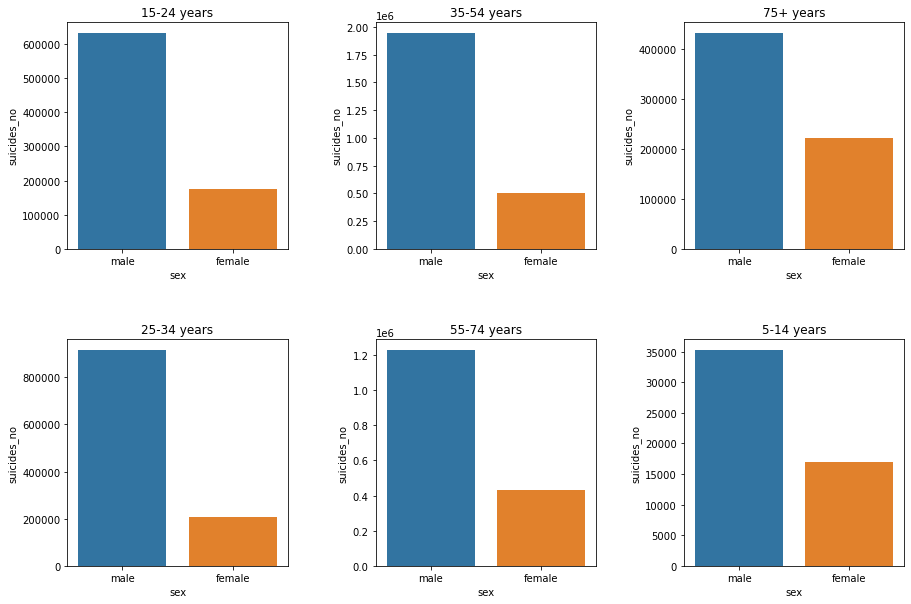

In [20]:
dfByAges = suicidios.groupby(["age", "sex"]).agg({ 'suicides_no' : 'sum', 'population' : "sum"}).sort_values(by=['suicides_no'],  ascending=False).reset_index()

ages = np.array(suicidios["age"].unique())
fig = plt.figure(figsize=(15,10))
fig.subplots_adjust(hspace=0.4, wspace=0.4)
for i in range(0, len(ages)):
    ax = fig.add_subplot(2, 3, i + 1)
    sns.barplot(x="sex", y="suicides_no", data=dfByAges[dfByAges.age == ages[i]])
    plt.title(ages[i])

## Resultados da análise exploratória

Análise de 101 países entre os anos 1985 à 2016. (31 anos)
Total de 27.820 casos de suicídios.

Nesse conjunto, a média de suicídios observados foi de 243 casos e 13 casos/100k hab.


No intervalo observado verificamos que os homens são os que mais se suicidam;
As maiores vítimas estão na faixa de 35-54 anos, enquanto os de 5-14 anos são a minoria.

Pessoas das gerações X, sileciosa e millenius estão entre as maiores vítimas;
 
Observou-se um correlação entre a RENDA PER CAPITA com os casos de SUICIDIO;

In [63]:
grafico = px.parallel_categories(suicidios, dimensions=['sex','age','rating'],
                                 labels={'sex':'Gênero vítimas', 'age':'Faixa etária', 'rating':'Taxa suicídio 100k/hab.'})
grafico.show()

## III - Machine Learning

In [37]:
suicidios.head(5)

,country,year,sex,age,suicides_no,population,suicides_100k_pop,gdp_per_capita,generation,rating
0,Albania,1987,male,15-24 years,21,312900,6.71,796,Generation X,Very high
1,Albania,1987,male,35-54 years,16,308000,5.19,796,Silent,Very high
2,Albania,1987,female,15-24 years,14,289700,4.83,796,Generation X,Very high
3,Albania,1987,male,75+ years,1,21800,4.59,796,G.I. Generation,Very high
4,Albania,1987,male,25-34 years,9,274300,3.28,796,Boomers,Very high


In [5]:
suicidios_por_renda_capita = suicidios[['population','suicides_no']]          # Extraio do atributo previsor da CLASSE
X_suicidios_renda_capita = suicidios_por_renda_capita.iloc[:, 0].values # Previsores
y_suicides_no = suicidios_por_renda_capita.iloc[:, 1].values           # Preditores

### 3.1 - Conversão de atributo categórico em número

In [71]:
# CONVERTE ATRIBUTO CATEGÓRICOS EM NUMÉRICOS {FAIXA ETÁRIA}
from sklearn.preprocessing import LabelEncoder
label_encoder_teste = LabelEncoder()

# Instanciando objeto
label_encoder_age = LabelEncoder()

# Converto os atributos categóricos em números
X_suicidios_renda_capita = label_encoder_age.fit_transform(X_suicidios_renda_capita)

In [72]:
print(np.unique(suicidios['age'], return_counts=True)) # Verifico a divisão das classes {número de suicídio por faixa etária}
print('---------------------------------------------------------------------------------------')
print(np.unique(X_suicidios_renda_capita, return_counts=True)) # Verifico a divisão das classes {número de suicídio}

(array(['15-24 years', '25-34 years', '35-54 years', '5-14 years',
       '55-74 years', '75+ years'], dtype=object), array([4642, 4642, 4642, 4610, 4642, 4642], dtype=int64))
---------------------------------------------------------------------------------------
(array([   0,    1,    2, ..., 2230, 2231, 2232], dtype=int64), array([12, 12, 12, ..., 12, 12, 12], dtype=int64))


###### Faixa etárias após a conversão (categórico para numérico):

<ul>
  <li><strong>15-24 years:</strong> 0;</li>
  <li><strong>25-34 years:</strong> 1;</li>
  <li><strong>35-54 years:</strong> 2;</li>
  <li><strong>5-14 years:</strong> 3;</li>
  <li><strong>55-74 years:</strong>   4;</li>
  <li><strong>75+ years:</strong> 5;</li>
</ul>

In [6]:
np.corrcoef(X_suicidios_renda_capita, y_suicides_no)

array([[1.        , 0.61616227],
       [0.61616227, 1.        ]])

In [7]:
X_suicidios_renda_capita = X_suicidios_renda_capita.reshape(-1,1)
X_suicidios_renda_capita.shape

(27820, 1)

In [8]:
from sklearn.linear_model import LinearRegression
regressor_suicidios = LinearRegression()
regressor_suicidios.fit(X_suicidios_renda_capita, y_suicides_no)

LinearRegression()

In [76]:
# b0
regressor_suicidios.intercept_

128.27711045055355

In [77]:
# b1
regressor_suicidios.coef_

array([0.10414267])

In [9]:
previsoes = regressor_suicidios.predict(X_suicidios_renda_capita)
previsoes

array([ 24.91424184,  24.21802195,  21.61785378, ..., 372.91876023,
       354.36833643, 184.9077043 ])

In [108]:
X_suicidios_renda_capita.ravel()

array([ 312900,  308000,  289700, ..., 2762158, 2631600, 1438935],
      dtype=int64)

In [10]:
grafico = px.scatter(x = X_suicidios_renda_capita.ravel(), y = y_suicides_no)
grafico.add_scatter(x = X_suicidios_renda_capita.ravel(), y = previsoes, name = 'Regressão')
grafico.show()